# Chapter 7 
# Display Geographical and Location Data with Map Plots and Enrich Your Dashboards with Markdown

* Choropleth maps
* Utilizing animation_frame to add a new layer to your plots
* Using callback functions with maps
* Create a Markdown component
* Understanding Map projections
* Using Scatter maps and scattergl
* Exploring Mapbox maps
* Tiles, zoom levels, and themes
* Understanding other map options and tools
* Incorporate the interactive map to the app

In [1]:
import os 

import plotly
import plotly.express as px
import plotly.graph_objects as go
import dash
import jupyter_dash as jd
from jupyter_dash import JupyterDash
import dash_core_components as dcc
import dash_html_components as html
import dash_bootstrap_components as dbc
from dash.dependencies import Output, Input
from dash.exceptions import PreventUpdate
import pandas as pd
pd.options.display.max_columns = None
mapbox_token = os.environ.get('token')

for p in [plotly, dash, jd, dcc, html, dbc, pd]:
    print(f'{p.__name__:-<30}v{p.__version__}')
    


plotly------------------------v4.14.1
dash--------------------------v1.18.1
jupyter_dash------------------v0.3.1
dash_core_components----------v1.14.1
dash_html_components----------v1.1.1
dash_bootstrap_components-----v0.11.1
pandas------------------------v1.2.0


In [2]:
poverty = pd.read_csv('../data/poverty.csv', low_memory=False)
poverty.head()

,Country Name,Country Code,year,"Annualized growth in per capita real survey mean consumption or income, bottom 40% (%)","Annualized growth in per capita real survey mean consumption or income, top 10% (%)","Annualized growth in per capita real survey mean consumption or income, top 60% (%)","Annualized growth in per capita real survey mean consumption or income, total population (%)",Annualized growth in per capita real survey median income or consumption expenditure (%),GINI index (World Bank estimate),Growth component of change in poverty at $1.90 a day (2011 PPP) (% of change),Growth component of change in poverty at $3.20 a day (2011 PPP) (% of change),Growth component of change in poverty at $5.50 a day (2011 PPP) (% of change),Income share held by fourth 20%,Income share held by highest 10%,Income share held by highest 20%,Income share held by lowest 10%,Income share held by lowest 20%,Income share held by second 20%,Income share held by third 20%,Median daily per capita income or consumption expenditure (2011 PPP),"Multidimensional poverty, Drinking water (% of population deprived)","Multidimensional poverty, Educational attainment (% of population deprived)","Multidimensional poverty, Educational enrollment (% of population deprived)","Multidimensional poverty, Electricity (% of population deprived)","Multidimensional poverty, Headcount ratio (% of population)","Multidimensional poverty, Monetary poverty (% of population deprived)","Multidimensional poverty, Sanitation (% of population deprived)",Number of poor at $1.90 a day (2011 PPP) (millions),Number of poor at $3.20 a day (2011 PPP) (millions),Number of poor at $5.50 a day (2011 PPP) (millions),"Population, total",Poverty gap at $1.90 a day (2011 PPP) (%),Poverty gap at $3.20 a day (2011 PPP) (% of population),Poverty gap at $5.50 a day (2011 PPP) (% of population),Poverty headcount ratio at $1.90 a day (2011 PPP) (% of population),"Poverty headcount ratio at $1.90 a day, Female (2011 PPP) (% of female population)","Poverty headcount ratio at $1.90 a day, Male (2011 PPP) (% of male population)","Poverty headcount ratio at $1.90 a day, age 0-14 (2011 PPP) (% of population age 0-14)","Poverty headcount ratio at $1.90 a day, age 15-64 (2011 PPP) (% of population age 15-64)","Poverty headcount ratio at $1.90 a day, age 65+ (2011 PPP) (% of population age 65+)","Poverty headcount ratio at $1.90 a day, rural (2011 PPP) (% of rural population)","Poverty headcount ratio at $1.90 a day, urban (2011 PPP) (% of urban population)","Poverty headcount ratio at $1.90 a day, with primary education (2011 PPP) (% of population age 16+ with primary education)","Poverty headcount ratio at $1.90 a day, with secondary education (2011 PPP) (% of population age 16+ with secondary education)","Poverty headcount ratio at $1.90 a day, without education (2011 PPP) (% of population age 16+ without education)","Poverty headcount ratio at $1.90 a day, with Tertiary/post-secondary education (2011 PPP) (% of population age 16+ with Tertiary/post-secondary education)",Poverty headcount ratio at $3.20 a day (2011 PPP) (% of population),Poverty headcount ratio at $5.50 a day (2011 PPP) (% of population),Poverty headcount ratio at national poverty lines (% of population),"Poverty headcount ratio at national poverty lines (% of population), including noncomparable values",Redistribution component of change in poverty at $1.90 a day (2011 PPP) (% of change),Redistribution component of change in poverty at $3.20 a day (2011 PPP) (% of change),Redistribution component of change in poverty at $5.50 a day (2011 PPP) (% of change),"Survey mean consumption or income per capita, bottom 40% (2011 PPP $ per day)","Survey mean consumption or income per capita, top 10% (2011 PPP $ per day)","Survey mean consumption or income per capita, top 60% (2011 PPP $ per day)","Survey mean consumption or income per capita, total population (2011 PPP $ per day)",Short Name,Table Name,Long Name,2-alpha code,Currency Unit,Spe

In [3]:
series = pd.read_csv('../data/PovStatsSeries.csv')
series.head(2)

,Series Code,Topic,Indicator Name,Short definition,Long definition,Unit of measure,Periodicity,Base Period,Other notes,Aggregation method,Limitations and exceptions,Notes from original source,General comments,Source,Statistical concept and methodology,Development relevance,Related source links,Other web links,Related indicators,License Type,Unnamed: 20
0,SI.DST.02ND.20,Poverty: Income distribution,Income share held by second 20%,NaN,Percentage share of income or consumption is t...,%,Annual,NaN,NaN,NaN,"Despite progress in the last decade, the chall...",NaN,The World Bank’s internationally comparable po...,"World Bank, Development Research Group. Data a...",Inequality in the distribution of income is re...,The World Bank Group's goal of promoting share...,NaN,NaN,NaN,CC BY-4.0,NaN
1,SI.DST.03RD.20,Poverty: Income distribution,Income share held by third 20%,NaN,Percentage share of income or consumption is t...,%,Annual,NaN,NaN,NaN,"Despite progress in the last decade, the chall...",NaN,The World Bank’s internationally comparable po...,"World Bank, Development Research Group. Data a...",Inequality in the distribution of income is re...,The World Bank Group's goal of promoting share...,NaN,NaN,NaN,CC BY-4.0,NaN


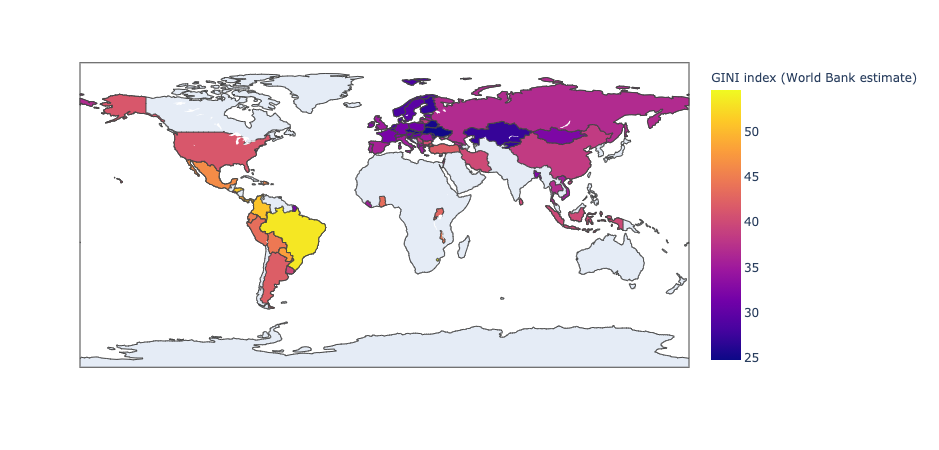

In [4]:
year = 2016
indicator = 'GINI index (World Bank estimate)'
df = poverty[poverty['is_country'] & poverty['year'].eq(year)]

px.choropleth(df, locations="Country Code", color=indicator)

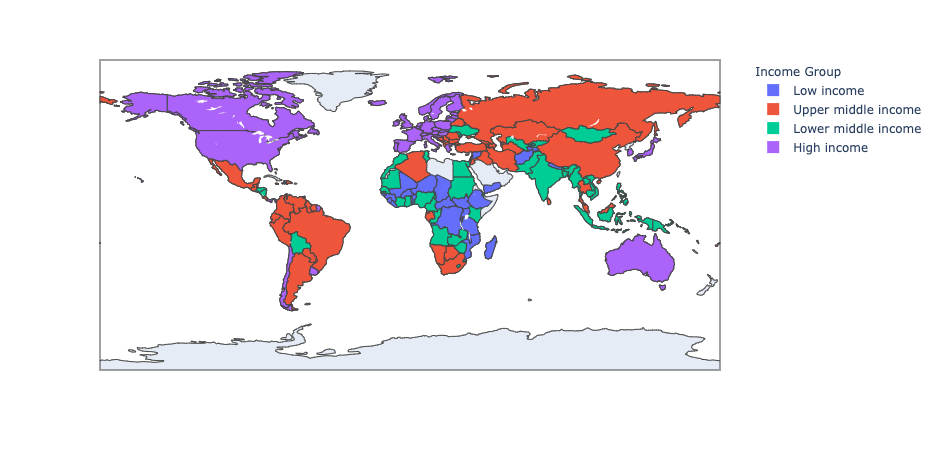

In [5]:
year = 2016
indicator = 'GINI index (World Bank estimate)'
df = poverty[poverty['is_country'] & poverty['year'].eq(year)]

px.choropleth(df, locations="Country Code", color='Income Group')

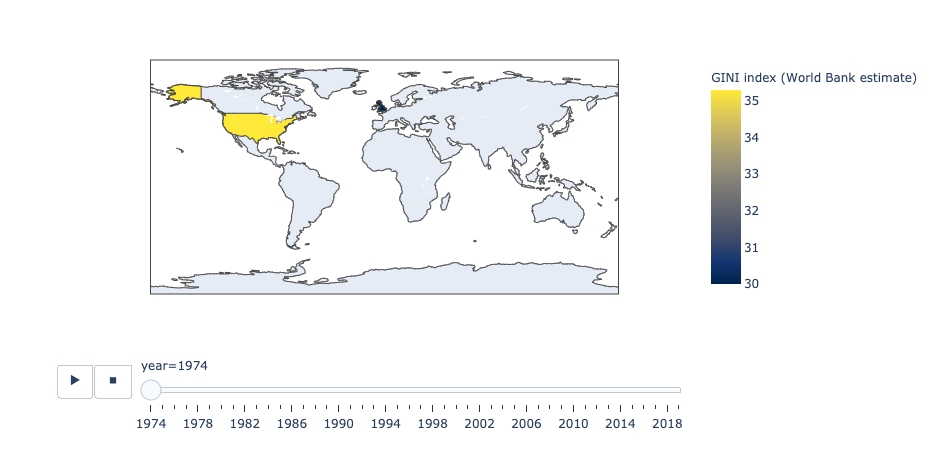

In [6]:
indicator = 'GINI index (World Bank estimate)'
px.choropleth(poverty[poverty['is_country']], 
              color_continuous_scale='cividis',
              locations='Country Code',
              color=indicator,
              animation_frame='year')

In [7]:
fig = px.choropleth()
[f for f in dir(fig.layout.geo) if f[0].islower()]

['bgcolor',
 'center',
 'coastlinecolor',
 'coastlinewidth',
 'countrycolor',
 'countrywidth',
 'domain',
 'figure',
 'fitbounds',
 'framecolor',
 'framewidth',
 'lakecolor',
 'landcolor',
 'lataxis',
 'lonaxis',
 'oceancolor',
 'on_change',
 'parent',
 'plotly_name',
 'pop',
 'projection',
 'resolution',
 'rivercolor',
 'riverwidth',
 'scope',
 'showcoastlines',
 'showcountries',
 'showframe',
 'showlakes',
 'showland',
 'showocean',
 'showrivers',
 'showsubunits',
 'subunitcolor',
 'subunitwidth',
 'to_plotly_json',
 'uirevision',
 'update',
 'visible']

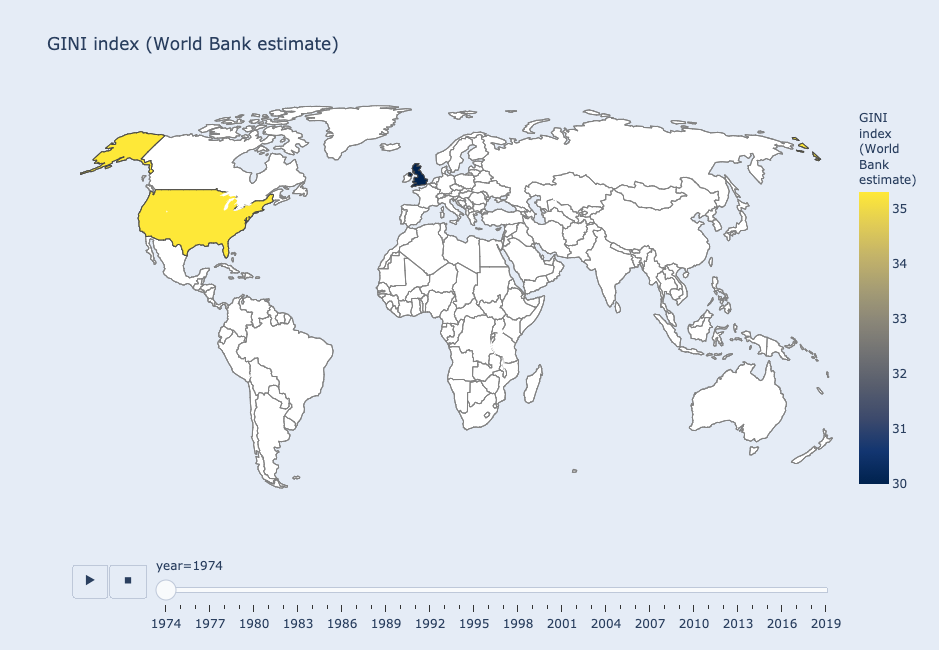

In [8]:
indicator = 'GINI index (World Bank estimate)'
fig = px.choropleth(poverty[poverty['is_country']], 
                    color_continuous_scale='cividis',
                    locations='Country Code',
                    color=indicator,
                    title=indicator,
                    hover_name='Country Name',
                    animation_frame='year', height=650)

fig.layout.geo.showframe = False
fig.layout.geo.showcountries = True
fig.layout.geo.projection.type = 'natural earth'
fig.layout.geo.lataxis.range = [-53, 76]
fig.layout.geo.lonaxis.range = [-137, 168]
fig.layout.geo.landcolor = 'white'
fig.layout.geo.bgcolor = '#E5ECF6'

fig.layout.paper_bgcolor = '#E5ECF6'
fig.layout.geo.countrycolor = 'gray'
fig.layout.geo.coastlinecolor = 'gray'
fig.layout.coloraxis.colorbar.title = indicator.replace(' ', '<br>')
fig

In [9]:
indicator = 'one two three four five six seven'

def multiline_indicator(indicator):
    final = []
    split = indicator.split()
    for i in range(0, len(split), 3):
        final.append(' '.join(split[i:i+3]))
    return '<br>'.join(final)
multiline_indicator(indicator)

'one two three<br>four five six<br>seven'

In [10]:
app = JupyterDash(__name__)

app.layout = html.Div([
    dcc.Markdown("""
# This is the main text of the page
### This is secondary text
* first item
* second item
* third item
""")
        
])

app.run_server(mode='inline', height=200, port=8080)

In [11]:
app = JupyterDash(__name__)

app.layout = html.Div([
    dcc.Dropdown(id='indicator_dropdown',
                 value='GINI index (World Bank estimate)',
                 options=[{'label': indicator, 'value': indicator}
                          for indicator in poverty.columns[3:54]]),
    dcc.Graph(id='indicator_map_chart'),
])

@app.callback(Output('indicator_map_chart', 'figure'),
              Input('indicator_dropdown', 'value'))
def display_generic_map_chart(indicator):
    df = poverty[poverty['is_country']]
    fig = px.choropleth(df, locations='Country Code', 
                        color=indicator,
                        title=indicator,
                        hover_name='Country Name',
                        color_continuous_scale='cividis',
                        animation_frame='year', height=650)
    fig.layout.geo.showframe = False
    fig.layout.geo.showcountries = True
    fig.layout.geo.projection.type = 'natural earth'
    fig.layout.geo.lataxis.range = [-53, 76]
    fig.layout.geo.lonaxis.range = [-137, 168]
    fig.layout.geo.landcolor = 'white'
    fig.layout.geo.bgcolor = '#E5ECF6'
    fig.layout.paper_bgcolor = '#E5ECF6'
    fig.layout.geo.countrycolor = 'gray'
    fig.layout.geo.coastlinecolor = 'gray'
    fig.layout.coloraxis.colorbar.title = multiline_indicator(indicator)
    return fig
    

app.run_server(mode='inline', height=700, port=8081)

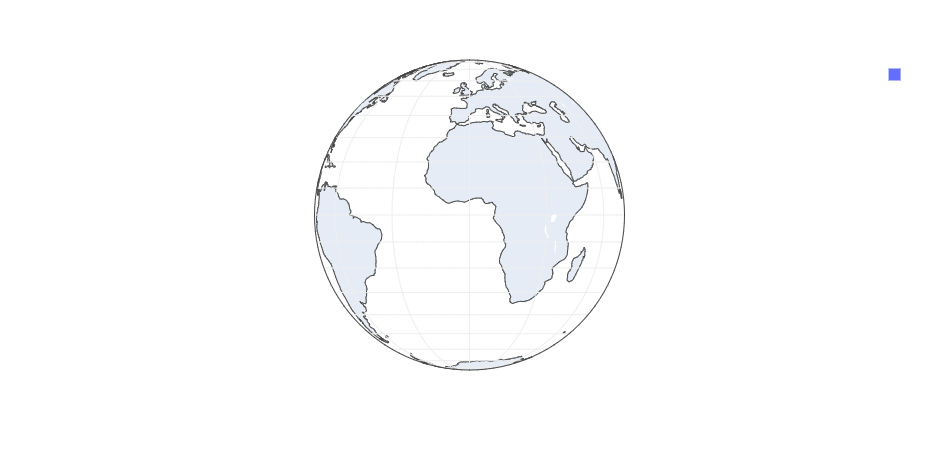

In [12]:
fig = px.choropleth(locations=df['Country Name'], projection='orthographic',)
fig.layout.geo.lataxis.showgrid = True
fig.layout.geo.lonaxis.showgrid = True
fig

In [13]:
app = JupyterDash(__name__, external_stylesheets=[dbc.themes.COSMO])

app.layout = html.Div([
    dcc.Dropdown(id='indicator_dropdown',
                 value='GINI index (World Bank estimate)',
                 options=[{'label': indicator, 'value': indicator}
                          for indicator in poverty.columns[3:54]]),
    dcc.Graph(id='indicator_map_chart'),
    dcc.Markdown(id='indicator_map_details_md',
                 style={'backgroundColor': '#E5ECF6'})
])

@app.callback(Output('indicator_map_chart', 'figure'),
              Output('indicator_map_details_md', 'children'),
              Input('indicator_dropdown', 'value'))
def display_generic_map_chart(indicator):
    df = poverty[poverty['is_country']]
    fig = px.choropleth(df, locations='Country Code', 
                        color=indicator,
                        title=indicator,
                        color_continuous_scale='cividis',
                        animation_frame='year', height=650)
    fig.layout.geo.showframe = False
    fig.layout.geo.showcountries = True
    fig.layout.geo.projection.type = 'natural earth'
    fig.layout.geo.lataxis.range = [-53, 76]
    fig.layout.geo.lonaxis.range = [-138, 167]
    fig.layout.geo.landcolor = 'white'
    fig.layout.geo.bgcolor = '#E5ECF6'
    fig.layout.paper_bgcolor = '#E5ECF6'
    fig.layout.geo.countrycolor = 'gray'
    fig.layout.geo.coastlinecolor = 'gray'
    fig.layout.coloraxis.colorbar.title = multiline_indicator(indicator)
    
    series_df = series[series['Indicator Name'].eq(indicator)]
    limitations = series_df['Limitations and exceptions'].fillna('N/A').str.replace('\n\n', ' ').values[0]
    markdown = f"""
    ## {series_df['Indicator Name'].values[0]}  
    
    {series_df['Long definition'].values[0]}  
    
    * **Unit of measure** {series_df['Unit of measure'].fillna('count').values[0]}
    * **Periodicity** {series_df['Periodicity'].fillna('N/A').values[0]}
    * **Source** {series_df['Source'].values[0]}
    
    ### Limitations and exceptions:  
    
    {limitations}  

    """
    return fig, markdown
    

app.run_server(mode='inline', height=1300, port=8080)

In [14]:
projections = ['equirectangular', 'mercator', 'orthographic', 'natural earth', 'kavrayskiy7',
               'miller', 'robinson', 'eckert4', 'azimuthal equal area', 'azimuthal equidistant',
               'conic equal area', 'conic conformal', 'conic equidistant', 'gnomonic',
               'stereographic', 'mollweide', 'hammer', 'transverse mercator', 'albers usa',
               'winkel tripel', 'aitoff', 'sinusoidal']

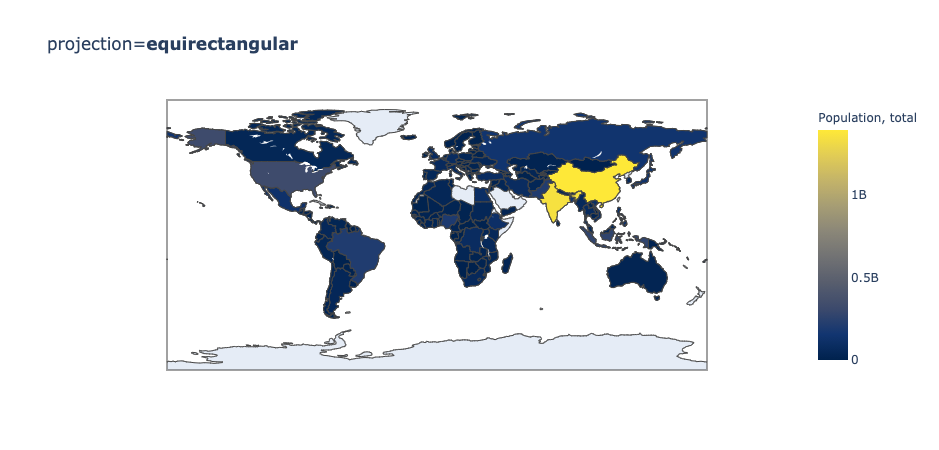

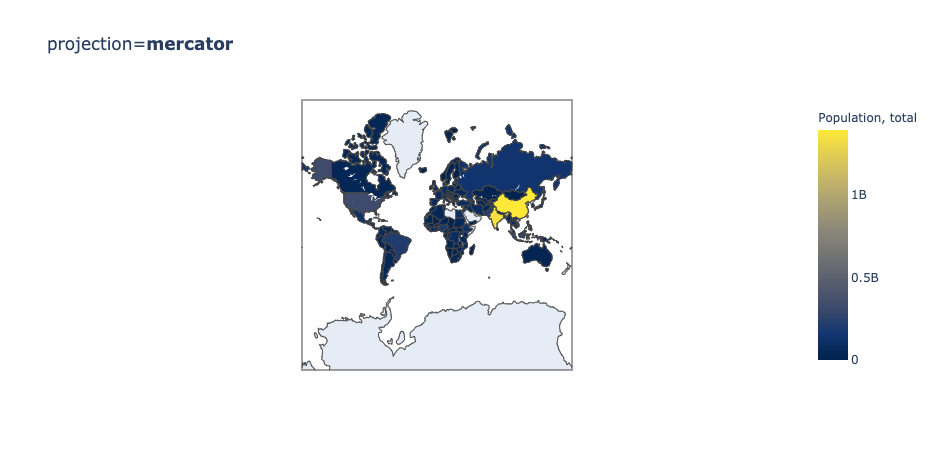

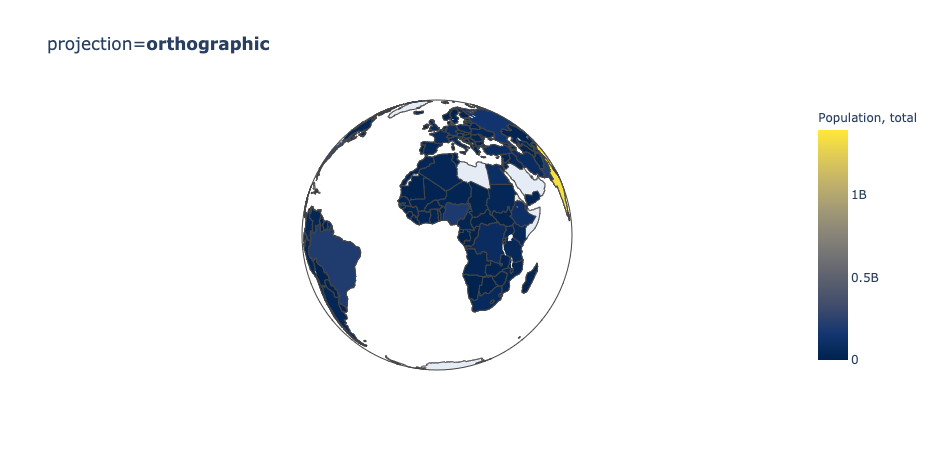

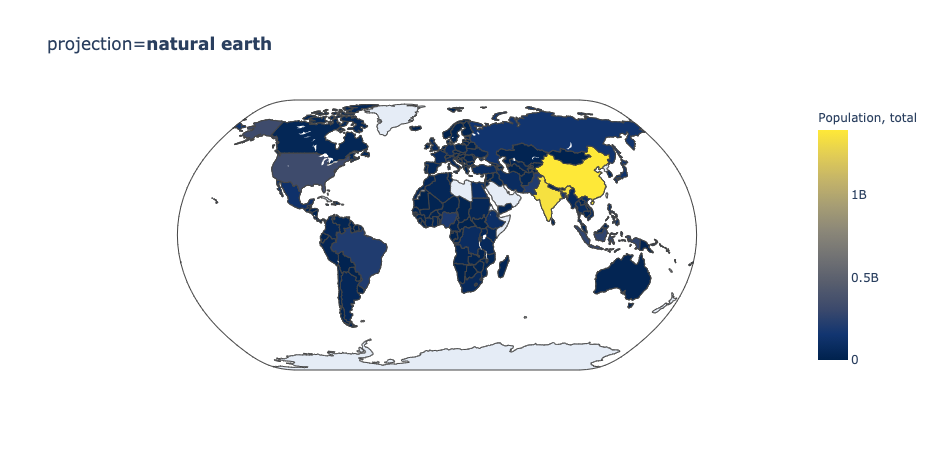

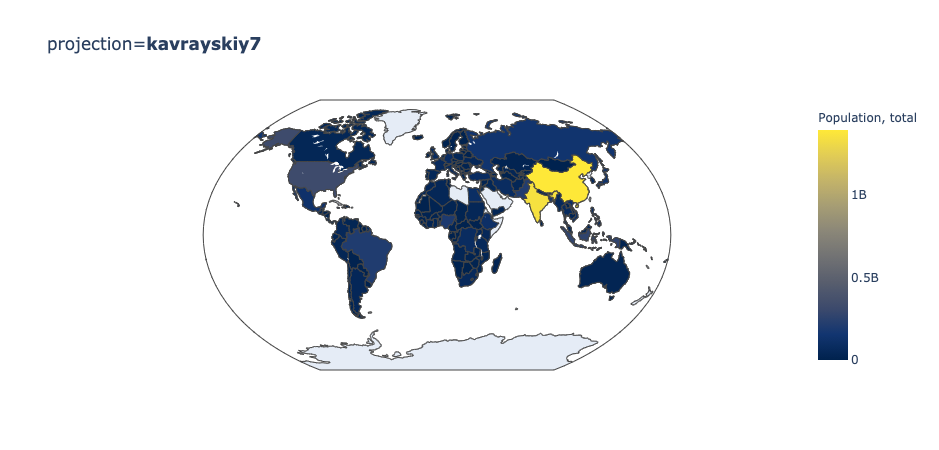

...

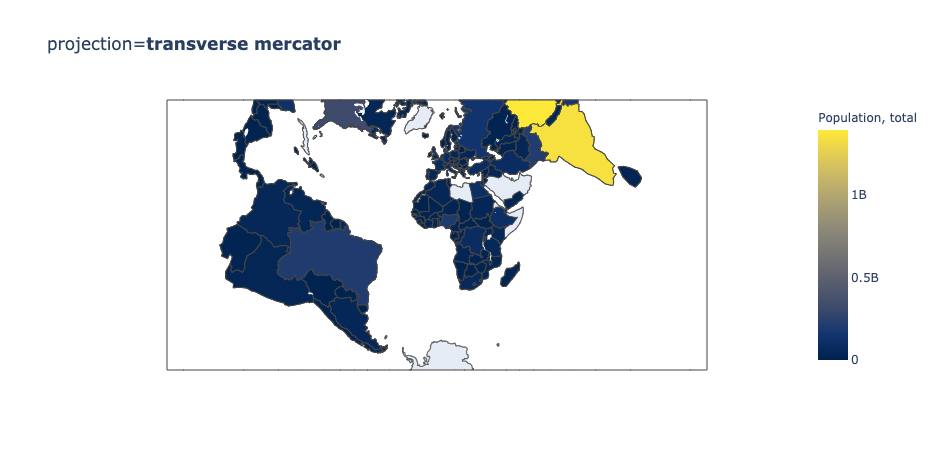

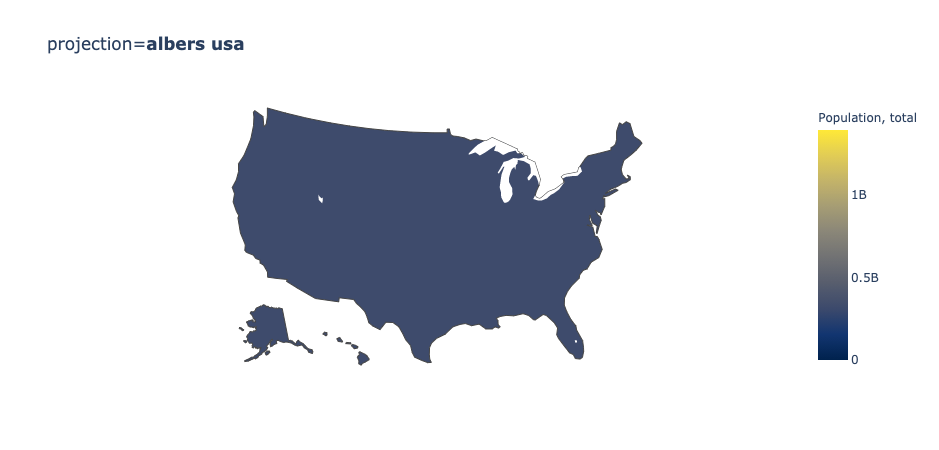

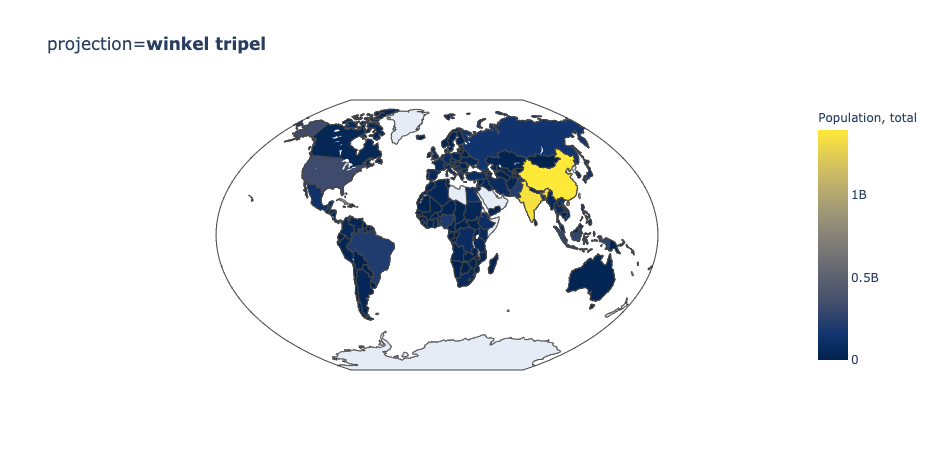

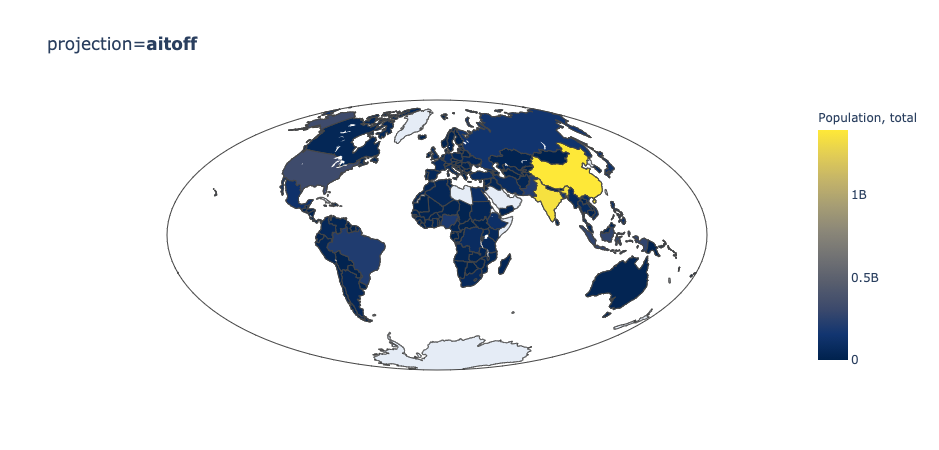

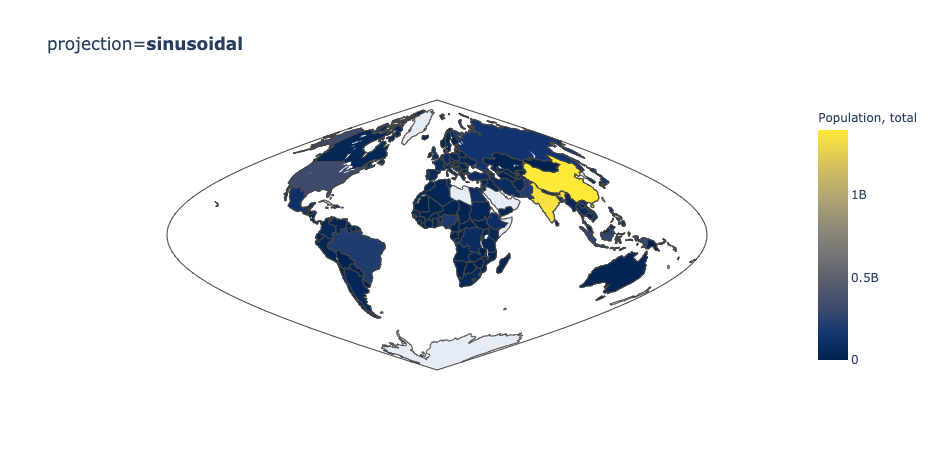

In [15]:
from plotly.subplots import make_subplots

fig = make_subplots(rows=6, cols=4, subplot_titles=projections)
pop2018_df = poverty[poverty['year'].eq(2018) & poverty['is_country']]
for i, proj in enumerate(projections):
    fig = px.choropleth(pop2018_df, color='Population, total', 
                        locations='Country Code',
                        color_continuous_scale='cividis', 
                 projection=proj, title=f'projection=<b>{proj}</b>')
    fig.show()
    print()

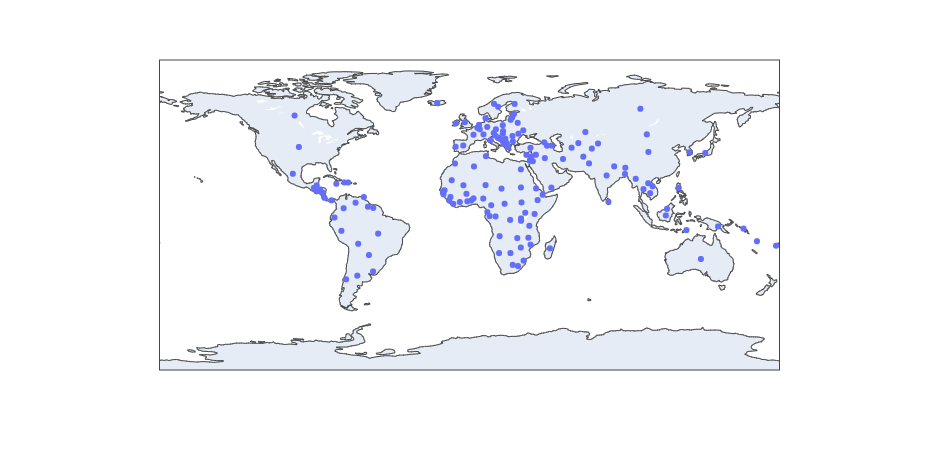

In [16]:
px.scatter_geo(poverty[poverty['year'].eq(2010) & poverty['is_country']],
               locations='Country Code')

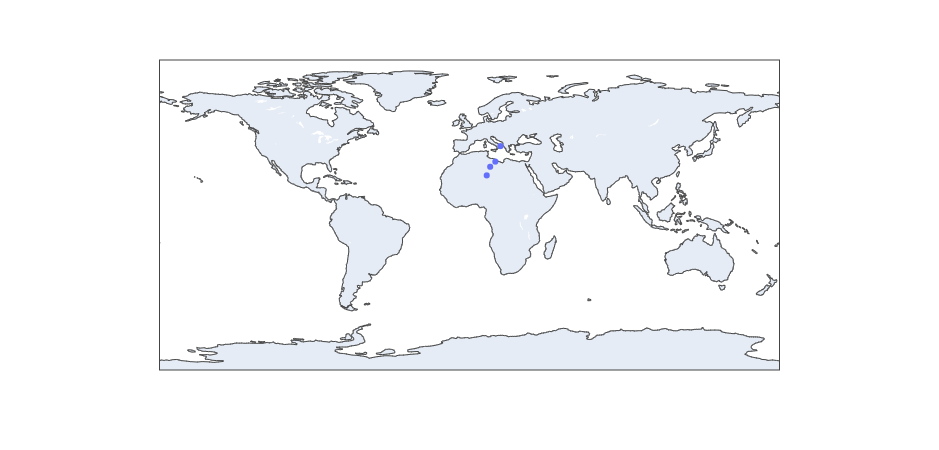

In [17]:
px.scatter_geo(lon=[10, 12, 15, 18], lat=[23, 28, 31, 40])

In [18]:
# lat_long = pd.read_html('https://developers.google.com/public-data/docs/canonical/countries_csv')[0]
# lat_long.to_csv('../data/lat_long.csv', index=False)

In [19]:
lat_long = pd.read_csv('../data/lat_long.csv')
lat_long

,country,latitude,longitude,name
0,AD,42.546245,1.601554,Andorra
1,AE,23.424076,53.847818,United Arab Emirates
2,AF,33.939110,67.709953,Afghanistan
3,AG,17.060816,-61.796428,Antigua and Barbuda
4,AI,18.220554,-63.068615,Anguilla
...,...,...,...,...
240,YE,15.552727,48.516388,Yemen
241,YT,-12.827500,45.166244,Mayotte
242,ZA,-30.559482,22.937506,South Africa
243,ZM,-13.133897,27.849332,Zambia


In [20]:
poverty = pd.merge(poverty, lat_long, how='left', left_on='2-alpha code', right_on='country')
poverty.head()

,Country Name,Country Code,year,"Annualized growth in per capita real survey mean consumption or income, bottom 40% (%)","Annualized growth in per capita real survey mean consumption or income, top 10% (%)","Annualized growth in per capita real survey mean consumption or income, top 60% (%)","Annualized growth in per capita real survey mean consumption or income, total population (%)",Annualized growth in per capita real survey median income or consumption expenditure (%),GINI index (World Bank estimate),Growth component of change in poverty at $1.90 a day (2011 PPP) (% of change),Growth component of change in poverty at $3.20 a day (2011 PPP) (% of change),Growth component of change in poverty at $5.50 a day (2011 PPP) (% of change),Income share held by fourth 20%,Income share held by highest 10%,Income share held by highest 20%,Income share held by lowest 10%,Income share held by lowest 20%,Income share held by second 20%,Income share held by third 20%,Median daily per capita income or consumption expenditure (2011 PPP),"Multidimensional poverty, Drinking water (% of population deprived)","Multidimensional poverty, Educational attainment (% of population deprived)","Multidimensional poverty, Educational enrollment (% of population deprived)","Multidimensional poverty, Electricity (% of population deprived)","Multidimensional poverty, Headcount ratio (% of population)","Multidimensional poverty, Monetary poverty (% of population deprived)","Multidimensional poverty, Sanitation (% of population deprived)",Number of poor at $1.90 a day (2011 PPP) (millions),Number of poor at $3.20 a day (2011 PPP) (millions),Number of poor at $5.50 a day (2011 PPP) (millions),"Population, total",Poverty gap at $1.90 a day (2011 PPP) (%),Poverty gap at $3.20 a day (2011 PPP) (% of population),Poverty gap at $5.50 a day (2011 PPP) (% of population),Poverty headcount ratio at $1.90 a day (2011 PPP) (% of population),"Poverty headcount ratio at $1.90 a day, Female (2011 PPP) (% of female population)","Poverty headcount ratio at $1.90 a day, Male (2011 PPP) (% of male population)","Poverty headcount ratio at $1.90 a day, age 0-14 (2011 PPP) (% of population age 0-14)","Poverty headcount ratio at $1.90 a day, age 15-64 (2011 PPP) (% of population age 15-64)","Poverty headcount ratio at $1.90 a day, age 65+ (2011 PPP) (% of population age 65+)","Poverty headcount ratio at $1.90 a day, rural (2011 PPP) (% of rural population)","Poverty headcount ratio at $1.90 a day, urban (2011 PPP) (% of urban population)","Poverty headcount ratio at $1.90 a day, with primary education (2011 PPP) (% of population age 16+ with primary education)","Poverty headcount ratio at $1.90 a day, with secondary education (2011 PPP) (% of population age 16+ with secondary education)","Poverty headcount ratio at $1.90 a day, without education (2011 PPP) (% of population age 16+ without education)","Poverty headcount ratio at $1.90 a day, with Tertiary/post-secondary education (2011 PPP) (% of population age 16+ with Tertiary/post-secondary education)",Poverty headcount ratio at $3.20 a day (2011 PPP) (% of population),Poverty headcount ratio at $5.50 a day (2011 PPP) (% of population),Poverty headcount ratio at national poverty lines (% of population),"Poverty headcount ratio at national poverty lines (% of population), including noncomparable values",Redistribution component of change in poverty at $1.90 a day (2011 PPP) (% of change),Redistribution component of change in poverty at $3.20 a day (2011 PPP) (% of change),Redistribution component of change in poverty at $5.50 a day (2011 PPP) (% of change),"Survey mean consumption or income per capita, bottom 40% (2011 PPP $ per day)","Survey mean consumption or income per capita, top 10% (2011 PPP $ per day)","Survey mean consumption or income per capita, top 60% (2011 PPP $ per day)","Survey mean consumption or income per capita, total population (2011 PPP $ per day)",Short Name,Table Name,Long Name,2-alpha code,Currency Unit,Spe

In [21]:
poverty[['Country Name', 'longitude', 'latitude', '2-alpha code']].sample(10)

,Country Name,longitude,latitude,2-alpha code
2592,"Gambia, The",-15.310139,13.443182,GM
6019,Poland,19.145136,51.919438,PL
2110,Equatorial Guinea,10.267895,1.650801,GQ
37,Afghanistan,67.709953,33.939110,AF
4555,Malawi,34.301525,-13.254308,MW
3683,Japan,138.252924,36.204824,JP
8057,Vietnam,108.277199,14.058324,VN
6574,Solomon Islands,160.156194,-9.645710,SB
4640,Maldives,73.220680,3.202778,MV
3237,Iceland,-19.020835,64.963051,IS


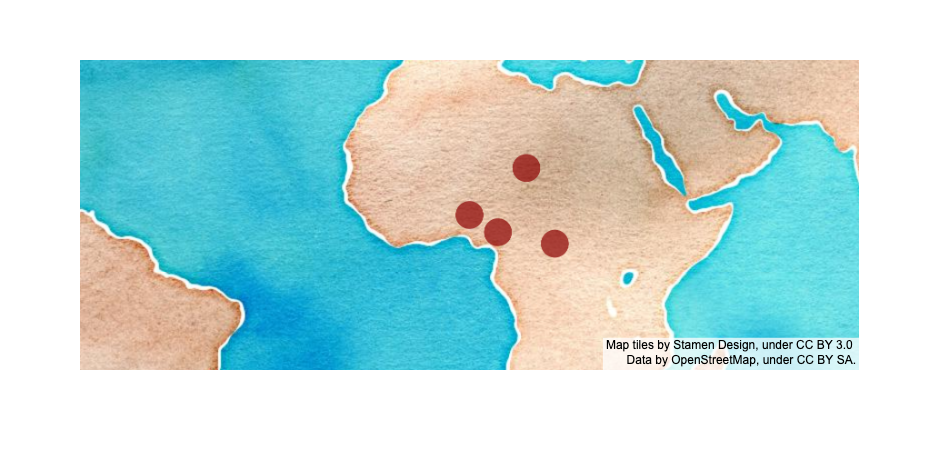

In [22]:
px.scatter_mapbox(lon=[5, 10, 15, 20], lat=[10, 7, 18, 5],
                  zoom=2, 
                  center={'lon': 5, 'lat': 10},
                  size=[5]*4,
                  color_discrete_sequence=['darkred'],
                  mapbox_style='stamen-watercolor')

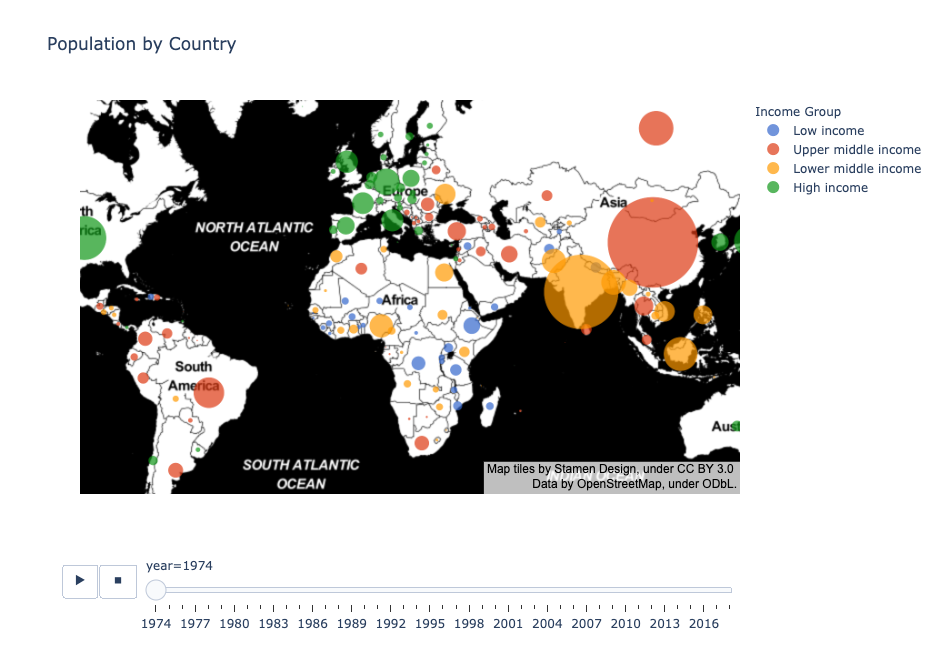

In [23]:
df = poverty[poverty['is_country']].dropna(subset=['Population, total'])

px.scatter_mapbox(df,
                  lon='longitude',
                  lat='latitude',
                  zoom=1,
                  size='Population, total', 
                  size_max=80, 
                  color='Income Group',
                  animation_frame='year',
                  opacity=0.7,
                  height=650,
                  hover_data=['Income Group', 'Region'],
                  color_discrete_sequence=px.colors.qualitative.G10,
                  mapbox_style='stamen-toner',
                  hover_name=df['Country Name'],
                  title='Population by Country')